# Avance 3 — Baseline: Detección de myotubos en imágenes microscópicas

## Introducción
En este avance se construye un modelo baseline para evaluar la viabilidad de detectar myotubos a partir de imágenes microscópicas. Un baseline funciona como punto de referencia, si su desempeño es comparable al azar o a una estrategia ingenua, puede indicar que el problema es intrínsecamente difícil, que las etiquetas/datos no contienen suficiente señal, o que el preprocesamiento y el pipeline requieren ajustes. En cambio, si el baseline supera claramente a una referencia nula, entonces el problema es viable y existe una base sólida para justificar enfoques posteriores más complejos.

## 1. Algoritmo

### Tipo de problema y naturaleza de los datos
El objetivo del proyecto es detectar myotubos en imágenes microscópicas, lo cual corresponde a un problema de detección de objetos (object detection), es decir, el modelo debe identificar dónde se encuentran los myotubos en la imagen y generar una predicción de localización (caja/polígono) junto con su confianza.

La entrada del modelo son datos no estructurados. A diferencia de problemas tabulares, aquí la información relevante está en patrones espaciales: textura, bordes, continuidad, orientación y contrastes locales, que son características típicas del dominio microscópico y particularmente importantes para estructuras alargadas como los myotubos.

### Elección del algoritmo baseline
Para construir un baseline sólido y comparable, se utiliza YOLO (Ultralytics) con transferencia de aprendizaje. Esta elección es adecuada por las siguientes razones:

1. Alineación directa con el objetivo  
   YOLO está diseñado específicamente para detección, optimizando simultáneamente la clasificación (presencia de objeto) y la localización (coordenadas).

2. Eficiencia y viabilidad para iteración rápida
   Un baseline debe poder entrenarse y evaluarse de manera ágil. YOLO permite establecer rápidamente un punto de referencia para responder: ¿existe señal suficiente en los datos para detectar myotubos? Esto es crucial antes de invertir tiempo en modelos más complejos.

3. Uso de pesos preentrenados (transfer learning)  
   En visión por computadora, entrenar desde cero suele requerir grandes volúmenes de datos. En contextos biomédicos es común tener datasets moderados, por lo que usar pesos preentrenados acelera convergencia y mejora generalización. Esto hace que el baseline sea más representativo del desempeño “realista” que se puede lograr con un enfoque estándar.


### Consideraciones sobre etiquetas y geometría del objeto
Los myotubos suelen ser estructuras elongadas y con orientación variable. Las anotaciones del dataset están en formato de polígonos/cajas rotadas (OBB), lo cual permite representar mejor su geometría. En este baseline se busca validar principalmente la capacidad de detección, es decir, encontrar instancias y localizarlas razonablemente.

### Conclusión
Dado que el problema es de detección en imágenes (datos no estructurados) y requiere localización, el uso de YOLO con transfer learning es un baseline apropiado, ya que ofrece un punto de referencia fuerte, reproducible y comunicable para evaluar viabilidad y definir el desempeño mínimo aceptable antes de explorar enfoques más complejos.


## 2. Preparación del dataset

Antes de entrenar el baseline, es indispensable organizar el conjunto de imágenes y etiquetas en el formato esperado por YOLO/Ultralytics. En particular, YOLO asume una estructura estándar por partición:

- `train/images` y `train/labels`
- `val/images` y `val/labels`
- `test/images` y `test/labels`

Esta separación permite:
- **Entrenar** con `train`,
- **Monitorear generalización** y ajustar hiperparámetros con `val`,
- **Estimar el desempeño real** (sin sesgo) con `test`.

Para asegurar que los resultados del baseline sean **reproducibles**, la partición se realiza con una semilla fija (`random.seed(42)`), evitando que variaciones aleatorias en el split cambien las métricas y dificulten comparaciones futuras. El split inicial utilizado es **80/10/10**, lo cual ofrece un balance razonable entre cantidad de datos para entrenamiento y conjuntos suficientes para validación y prueba.

A continuación se define una función que:
1) barajea el listado de imágenes,  
2) crea los directorios necesarios por split, y  
3) copia cada imagen junto con su archivo de etiqueta correspondiente (`.txt`) manteniendo trazabilidad por nombre.


In [1]:
!pip install ultralytics
import os
import random
import shutil
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2
import torch
#from shapely.geometry import Polygon
from ultralytics import YOLO
from pathlib import Path
from datetime import datetime

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 20.7 MB/s eta 0:00:00
Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
def split_data(images_path, labels_path, output_base, split_ratio=(0.8, 0.1, 0.1)):
    """
    Organiza las imágenes y etiquetas en la estructura de carpetas requerida por YOLO.
    """
    images = sorted(list(Path(images_path).glob("*.png")))
    random.seed(42) # Para reproducibilidad
    random.shuffle(images)

    # Calcular índices
    train_end = int(len(images) * split_ratio[0])
    val_end = train_end + int(len(images) * split_ratio[1])

    sets = {
        'train': images[:train_end],
        'val': images[train_end:val_end],
        'test': images[val_end:]
    }

    for phase, img_list in sets.items():
        # Crear carpetas
        (output_base / phase / 'images').mkdir(parents=True, exist_ok=True)
        (output_base / phase / 'labels').mkdir(parents=True, exist_ok=True)

        for img_p in img_list:
            # Copiar imagen
            shutil.copy(img_p, output_base / phase / 'images' / img_p.name)
            # Copiar etiqueta (asumiendo que tiene el mismo nombre .txt)
            label_p = Path(labels_path) / (img_p.stem + ".txt")
            if label_p.exists():
                shutil.copy(label_p, output_base / phase / 'labels' / label_p.name)

# --- Ejecución ---
images_path = Path("/content/drive/MyDrive/Pregrado - Posgrado - Trabajo/Maestría - Inteligencia Artificial Aplicada/13. Proyecto integrador/Myotubes/notebooks_proyecto_integrador/Avance3/data/processed_2/images")
labels_path = Path("/content/drive/MyDrive/Pregrado - Posgrado - Trabajo/Maestría - Inteligencia Artificial Aplicada/13. Proyecto integrador/Myotubes/notebooks_proyecto_integrador/Avance3/data/processed_2/label")

data_path = Path('/content/drive/MyDrive/Pregrado - Posgrado - Trabajo/Maestría - Inteligencia Artificial Aplicada/13. Proyecto integrador/Myotubes/notebooks_proyecto_integrador/Avance3/data')

model_path = Path('/content/drive/MyDrive/Pregrado - Posgrado - Trabajo/Maestría - Inteligencia Artificial Aplicada/13. Proyecto integrador/Myotubes/notebooks_proyecto_integrador/Avance3/models')

#images_path = Path(r"G:\.shortcut-targets-by-id\1T3SwAzhgxn3hAIf0RUSDqKckjAaoPRrj\Myotubes\notebooks_proyecto_integrador\Myotubes\data\raw_all\images")
#labels_path = Path(r"G:\.shortcut-targets-by-id\1T3SwAzhgxn3hAIf0RUSDqKckjAaoPRrj\Myotubes\notebooks_proyecto_integrador\Myotubes\data\raw_all\labels_clean")

#data_path = Path(r"G:\.shortcut-targets-by-id\1T3SwAzhgxn3hAIf0RUSDqKckjAaoPRrj\Myotubes\notebooks_proyecto_integrador\Avance3\data\yolo")

#model_path = Path(r"G:\.shortcut-targets-by-id\1T3SwAzhgxn3hAIf0RUSDqKckjAaoPRrj\Myotubes\notebooks_proyecto_integrador\Avance3\models")



raw_split_path = Path(str(data_path / 'processed_2'))

#split_data(images_path=images_path,
#           labels_path=labels_path,
#           output_base=raw_split_path)

## 3. Generación de características visuales: Pseudo-RGB Stack para realce de myotubos

Dado que las imágenes microscópicas pueden presentar variabilidad de iluminación, bajo contraste local, y estructuras alargadas con orientaciones diversas, se implementa un preprocesamiento orientado a resaltar señales relevantes para el detector. En lugar de usar una imagen de un solo canal (escala de grises) replicada tres veces, se construye una representación de tres canales (Pseudo-RGB) que combina transformaciones complementarias:

- Canal R — CLAHE (Contrast Limited Adaptive Histogram Equalization):
  Mejora el contraste local y rescata detalles tenues sin saturar regiones brillantes. Esto ayuda a separar estructuras del fondo cuando la adquisición es heterogénea.

- Canal G — Filtro de Meijering:*
  Diseñado para realzar estructuras tipo tubo/fibra. Es especialmente útil para mejorar la continuidad y conectividad visual de los myotubos, que suelen ser delgados y elongados.

- Canal B — Transformada de Distancia (Distance Transform):
  Aporta una señal geométrica, ya que estima distancias al “centro” de regiones binarizadas, ayudando a codificar forma y eje central de estructuras. Esto puede facilitar la localización en escenarios con bordes difusos.

Esta estrategia actúa como una forma de extracción de características sobre datos no estructurados (imágenes), y sirve para evaluar si un realce dirigido del dominio mejora el desempeño del baseline.

A continuación se implementan:
1) la función para construir el stack (y opcionalmente inspeccionar los canales), y  
2) un pipeline para procesar cada split, guardar las imágenes resultantes y copiar las etiquetas correspondientes.

### Trazabilidad y eficiencia del preprocesamiento

El preprocesamiento puede ser costoso cuando el dataset es grande. Para evitar reprocesar imágenes innecesariamente, el pipeline incluye una verificación de existencia: si la imagen procesada ya se encuentra en el directorio destino, se omite su procesamiento. Esto permite re-ejecutar la notebook sin duplicar trabajo y mantiene consistencia entre ejecuciones.

Finalmente, se genera un archivo `data_processed.yaml` con las rutas a `train/val/test`, la cantidad de clases (`nc=1`) y el nombre de la clase (`myotube`). Este YAML es el insumo directo que utilizará YOLO durante entrenamiento y evaluación del baseline.


In [ ]:
import cv2
import numpy as np
import yaml
import shutil
from pathlib import Path
from skimage.filters import meijering
from tqdm import tqdm

def get_optimal_stack(image_path):
    """
    Crea un tensor de 3 canales optimizado para la detección de miotubos.
    Canal R: CLAHE (Detalle de textura y contraste local)
    Canal G: Meijering (Conectividad estructural de la red)
    Canal B: Transformada de Distancia (Geometría y eje central)
    """
    # 1. Cargar imagen en escala de grises
    img = cv2.imread(str(image_path), 0)
    if img is None: return None

    # --- Canal R: CLAHE ---
    # Resalta lo tenue sin quemar lo brillante
    clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8, 8))
    channel_r = clahe.apply(img)

    # --- Canal G: Filtro de Meijering ---
    # El ganador en realce de fibras. Usamos un rango de sigmas para grosores variados.
    meij_img = meijering(img, sigmas=range(1, 10, 2), black_ridges=False, mode='reflect')
    channel_g = cv2.normalize(meij_img, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

    # --- Canal B: Transformada de Distancia ---
    # Binarizamos el Meijering (que ya viene limpio) para calcular distancias
    _, mask = cv2.threshold(channel_g, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    dist = cv2.distanceTransform(mask, cv2.DIST_L2, 5)
    channel_b = cv2.normalize(dist, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

    # Stack final
    return cv2.merge([channel_r, channel_g, channel_b]), channel_r, channel_g, channel_b

def process_and_save_dataset(source_path, target_path):
    """
    Aplica el Pseudo-RGB Stack evitando procesar archivos que ya existen en el destino.
    """
    source_path = Path(source_path)
    target_path = Path(target_path)

    for split in ['train', 'val', 'test']:
        print(f"📦 Revisando split: {split}...")
        img_input = source_path / split / 'images'
        img_output = target_path / split / 'images'
        label_input = source_path / split / 'labels'
        label_output = target_path / split / 'labels'

        # Crear directorios de destino si no existen
        img_output.mkdir(parents=True, exist_ok=True)
        label_output.mkdir(parents=True, exist_ok=True)

        images = list(img_input.glob("*.png"))
        skipped_count = 0

        for img_p in tqdm(images, desc=f"Procesando {split}"):
            target_img_path = img_output / img_p.name
            target_label_path = label_output / (img_p.stem + ".txt")

            # --- VERIFICACIÓN DE EXISTENCIA (QA Check) ---
            # Si la imagen ya existe, saltamos el proceso pesado
            if target_img_path.exists():
                skipped_count += 1
                continue

            # 1. Aplicar tu función de stack óptimo
            stack, _, _, _ = get_optimal_stack(img_p)

            if stack is not None:
                # 2. Guardar imagen procesada
                cv2.imwrite(str(target_img_path), stack)

                # 3. Copiar etiquetas (Trazabilidad)
                orig_label = label_input / (img_p.stem + ".txt")
                if orig_label.exists():
                    shutil.copy(orig_label, target_label_path)

        print(f"✨ Split {split} finalizado. Procesadas nuevas: {len(images) - skipped_count}, Saltadas: {skipped_count}")

    # 4. Actualizar el archivo de configuración YAML
    processed_config = {
        'train': str(target_path / 'train' / 'images'),
        'val': str(target_path / 'val' / 'images'),
        'test': str(target_path / 'test' / 'images'),
        'nc': 1,
        'names': ['myotube']
    }

    with open(target_path / 'data_processed.yaml', 'w') as f:
        yaml.dump(processed_config, f)

    print(f"\n✅ Dataset listo y actualizado en: {target_path}")

data_path = Path(r"G:\.shortcut-targets-by-id\1T3SwAzhgxn3hAIf0RUSDqKckjAaoPRrj\Myotubes\notebooks_proyecto_integrador\Avance3\data")
data_path_source = Path(r"G:\.shortcut-targets-by-id\1T3SwAzhgxn3hAIf0RUSDqKckjAaoPRrj\Myotubes\data\yolo")

# --- EJECUCIÓN DEL PREPROCESAMIENTO ---

data_processed = str(data_path / 'processed_2')
process_and_save_dataset(data_path_source, data_processed)

In [ ]:
import yaml
data_config = {
    'train': str(raw_split_path / 'train' / 'images'),
    'val': str(raw_split_path / 'val' / 'images'),
    'test': str(raw_split_path / 'test' / 'images'),
    'nc': 1,
    'names': ['myotube']
}

with open(raw_split_path / 'data_processed.yaml', 'w') as f:
    yaml.dump(data_config, f)

## 4. Entrenamiento del baseline con YOLO (transfer learning)

Con el dataset ya organizado (train/val/test) y, en su caso, con las imágenes preprocesadas mediante el Pseudo-RGB Stack, se procede a entrenar el modelo baseline de detección.

### ¿Qué modelo se entrena y por qué?
Se utiliza YOLO de Ultralytics inicializado desde un archivo `.pt` (pesos preentrenados). Esto implica que el entrenamiento se realiza mediante transfer learning, es decir, el modelo parte de representaciones visuales aprendidas previamente y se ajusta (*fine-tuning*) al dominio microscópico de myotubos. Este enfoque suele ser más estable y eficiente que entrenar desde cero cuando el tamaño del dataset es moderado.

### Configuración experimental (baseline reproducible)
Para que el baseline sea útil como referencia y comparable en futuras iteraciones, se define una configuración explícita:

- Épocas (epochs): se asigna un máximo alto para permitir convergencia; en práctica, el entrenamiento puede detenerse antes si la validación deja de mejorar.
- Resolución (imgsz): se usa una resolución alta para capturar estructuras finas y elongadas; esto puede ser clave en micrografías donde los detalles pequeños definen el objeto.
- Batch size: se ajusta al hardware disponible, buscando estabilidad sin exceder memoria.
- Aumentos (augment): se habilitan para mejorar la generalización ante variabilidad de orientación/iluminación/fondo.
- Trazabilidad del experimento: se especifica `project` y `name` para guardar resultados, curvas y checkpoints, facilitando auditoría y reproducibilidad.

A continuación se carga el modelo y se lanza el entrenamiento usando el archivo YAML del dataset procesado.

In [3]:
data_path = Path ('/content/drive/MyDrive/Myotubes/notebooks_proyecto_integrador/Avance3/data')
raw_split_path = Path('/content/drive/MyDrive/Myotubes/notebooks_proyecto_integrador/Avance3/data/processed_2')
model_path = Path('/content/drive/MyDrive/Myotubes/notebooks_proyecto_integrador/Avance3/models')

In [4]:
from ultralytics import YOLO

# 1. Cargar el modelo pre-entrenado (OBB)
model_raw = YOLO("yolo11s-obb.pt")
data_yaml = str(raw_split_path / 'data_processed.yaml')

# 2. Entreanmiento
results_raw = model_raw.train(
    data=data_yaml,
    project=model_path,
    name='yolo11n_preprocees_images_yolofolder',
    # --- Parámetros de Potencia ---
    epochs=300,                  # Le damos tiempo para converger (el Early Stopping actuará si es necesario)
    imgsz=1536,                  # Resolución máxima para detectar miotubos finos y conectividad
    batch=16,                    # Batch size ajustado para CPU
    device=0,                    # CPU activa
    # --- Aumentos Estructurales ---
    augment=True,                # Activa el pipeline de aumentos
)

Ultralytics 8.4.14 🚀 Python-3.12.12 torch-2.9.0+cu128 CUDA:0 (NVIDIA RTX PRO 6000 Blackwell Server Edition, 97250MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=True, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/drive/MyDrive/Myotubes/notebooks_proyecto_integrador/Avance3/data/processed_2/data_processed.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=300, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=1536, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11s-obb.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=

## Resultados del entrenamiento (YOLO11s-obb + transfer learning)

El entrenamiento se detuvo automáticamente mediante Early Stopping:

- Se configuró un máximo de 300 épocas, pero el proceso se detuvo en la época 134 porque no hubo mejora durante 100 épocas consecutivas (patience=100).
- El mejor modelo se obtuvo en la época 34 y se guardó como best.pt. Esto sugiere que el modelo converge temprano y que, después de cierto punto, continuar entrenando no aporta mejoras en validación y potencialmente incrementa el riesgo de sobreajuste.

### Desempeño en validación (checkpoint best.pt)
En el conjunto de validación (45 imágenes, 601 instancias) se obtuvo:

- Precisión (P): 0.806  
- Recall (R): 0.764  
- mAP@50: 0.863  
- mAP@50–95: 0.547  

Interpretación rápida del baseline:
- El modelo logra detectar una fracción alta de myotubos (recall ≈ 0.76), lo cual indica que sí existe señal en los datos y que el problema es viable con un enfoque estándar.
- La precisión es alta (P ≈ 0.81), lo que sugiere un balance favorable entre cobertura y falsos positivos en validación.
- La diferencia entre mAP@50 (0.863) y mAP@50–95 (0.547) indica que el modelo mantiene buen desempeño incluso cuando se exigen criterios de localización más estrictos, lo cual es consistente con el uso de un modelo con soporte OBB.


## 5. Evaluación del baseline en el conjunto de prueba (test) y auditoría geométrica (IoU)

Una vez entrenado el baseline, la evaluación se realiza sobre el conjunto de prueba (test), el cual no fue utilizado durante el entrenamiento ni durante la validación. Esto permite estimar el desempeño esperado en datos no vistos y reduce el riesgo de conclusiones optimistas por ajuste al conjunto de entrenamiento.

En detección de objetos, las métricas estándar como mAP@50, mAP@50–95, precision y recall miden la calidad global del detector bajo diferentes umbrales. Sin embargo, en este problema los myotubos son estructuras elongadas y con orientación variable, y las etiquetas del dataset están en formato OBB (polígono de 4 puntos). Por ello, además del reporte estándar de YOLO, se añade una auditoría geométrica manual basada en IoU para analizar con más detalle la precisión espacial de las predicciones.


En esencia, a continuación:

1. Lee etiquetas OBB desde archivos `.txt` con 9 columnas (clase + 4 puntos normalizados), escalándolas a coordenadas reales en píxeles y construyendo polígonos de ground truth.

2. Genera un IoU manual comparando las predicciones contra las etiquetas reales:
   - Ground truth: polígonos OBB (etiquetas reales).
   - Predicción: se detecta automáticamente el formato disponible en la salida del modelo:
     - Si el modelo es OBB: se utilizan cajas rotadas a partir de `res.obb.xyxyxyxy` (4 esquinas) y se convierten a polígonos.
     - Si el modelo es HBB: se utilizan cajas axis-aligned a partir de `res.boxes.xyxy` y se convierten a rectángulos.

3. Para cada predicción, se calcula el IoU contra todos los polígonos reales de la imagen y se conserva el mejor IoU (best match). Adicionalmente, si en una imagen no se predice nada pero existen etiquetas (falsos negativos), se penaliza asignando IoU = 0 para esas instancias omitidas.

4. Finalmente, se construye un reporte visual con:
   - Histograma de IoU (distribución de precisión geométrica),
   - Línea de IoU promedio,
   - Tabla de métricas finales del set de prueba (mAP, precision, recall, IoU promedio).


In [5]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from shapely.geometry import Polygon, box
from ultralytics import YOLO
from pathlib import Path
from datetime import datetime

Extrayendo métricas del set de prueba...
Ultralytics 8.4.14 🚀 Python-3.12.12 torch-2.9.0+cu128 CUDA:0 (NVIDIA RTX PRO 6000 Blackwell Server Edition, 97250MiB)
val: Fast image access ✅ (ping: 0.1±0.0 ms, read: 3300.5±200.9 MB/s, size: 10882.1 KB)
val: Scanning /content/drive/MyDrive/Myotubes/notebooks_proyecto_integrador/Avance3/data/processed_2/test/labels.cache... 32 images, 2 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 32/32 16.8Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 2/2 1.2s/it 2.4s
                   all         32        466      0.779      0.796      0.864      0.537
Speed: 3.0ms preprocess, 4.0ms inference, 0.0ms loss, 7.1ms postprocess per image
Results saved to /content/runs/obb/val2
Calculando IoU real con Shapely...


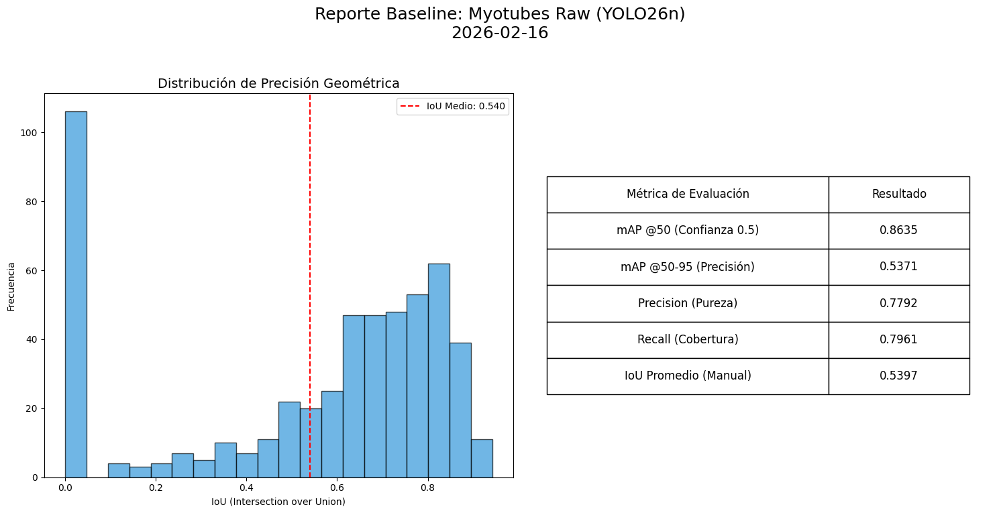

Auditoría completada. IoU Promedio: 0.5397


In [7]:
# ==========================================
# 1. LECTOR DE ETIQUETAS OBB (9 COLUMNAS)
# ==========================================
def read_myotube_labels(label_path, img_w, img_h):
    """Lee etiquetas de 9 columnas y las escala a píxeles reales."""
    polys = []
    if not label_path.exists():
        return polys

    with open(label_path, 'r') as f:
        for line in f:
            parts = list(map(float, line.strip().split()))
            # Formato: clase x1 y1 x2 y2 x3 y3 x4 y4 (normalizado)
            if len(parts) == 9:
                pts = [
                    (parts[1] * img_w, parts[2] * img_h),
                    (parts[3] * img_w, parts[4] * img_h),
                    (parts[5] * img_w, parts[6] * img_h),
                    (parts[7] * img_w, parts[8] * img_h)
                ]
                polys.append(Polygon(pts))
    return polys

# ==========================================
# 2. MOTOR DE CÁLCULO DE IoU MANUAL
# ==========================================
def get_manual_ious_fixed(results_list, labels_dir):
    """
    Calcula IoU detectando automáticamente si el modelo es OBB o HBB.
    Compara las predicciones contra las etiquetas OBB (polígonos) reales.
    """
    all_ious = []
    labels_path = Path(labels_dir)

    for res in results_list:
        h, w = res.orig_shape
        img_name = Path(res.path).stem
        label_file = labels_path / f"{img_name}.txt"

        # 1. Cargar etiquetas reales (Polígonos OBB)
        gt_polys = read_myotube_labels(label_file, w, h)

        # 2. Extraer Predicciones según el formato del modelo
        preds_to_process = []

        # CASO A: El modelo es OBB (usa .obb)
        if hasattr(res, 'obb') and res.obb is not None and len(res.obb) > 0:
            # xyxyxyxy nos da las 4 esquinas de la caja rotada
            obb_coords = res.obb.xyxyxyxy.cpu().numpy()
            preds_to_process = [Polygon(p) for p in obb_coords]

        # CASO B: El modelo es HBB estándar (usa .boxes)
        elif hasattr(res, 'boxes') and res.boxes is not None and len(res.boxes) > 0:
            hbb_coords = res.boxes.xyxy.cpu().numpy()
            preds_to_process = [box(*b) for b in hbb_coords]

        # 3. Calcular Intersección sobre Unión
        if preds_to_process:
            for p_poly in preds_to_process:
                if not p_poly.is_valid:
                    p_poly = p_poly.buffer(0) # Corregir polígonos inválidos si existen

                current_image_ious = []
                for g in gt_polys:
                    if not g.is_valid:
                        g = g.buffer(0)

                    inter = p_poly.intersection(g).area
                    union = p_poly.area + g.area - inter
                    current_image_ious.append(inter / union if union > 0 else 0)

                # Guardamos el mejor IoU encontrado para esta predicción
                all_ious.append(max(current_image_ious) if current_image_ious else 0.0)

        # 4. Penalización por Falsos Negativos (Miotubos omitidos)
        elif len(gt_polys) > 0:
            # Si el modelo no predijo nada pero había etiquetas, cuenta como IoU 0
            all_ious.extend([0.0] * len(gt_polys))

    return all_ious

# ==========================================
# 3. GENERADOR DE REPORTE (SIN CURVAS)
# ==========================================
def plot_final_report(metrics, ious, title="Auditoría de Calidad"):
    """Dashboard con histograma de IoU y tabla de métricas finales."""
    fig = plt.figure(figsize=(15, 8))
    plt.suptitle(f"{title}\n{datetime.now().strftime('%Y-%m-%d')}", fontsize=18)

    # A. Histograma de IoU Real
    ax1 = plt.subplot(1, 2, 1)
    ax1.hist(ious, bins=20, color='#3498db', edgecolor='black', alpha=0.7)
    mean_iou = np.mean(ious) if ious else 0
    ax1.axvline(mean_iou, color='red', linestyle='--', label=f'IoU Medio: {mean_iou:.3f}')
    ax1.set_title("Distribución de Precisión Geométrica", fontsize=14)
    ax1.set_xlabel("IoU (Intersection over Union)")
    ax1.set_ylabel("Frecuencia")
    ax1.legend()

    # B. Tabla de Resultados para Tesis
    ax2 = plt.subplot(1, 2, 2)
    ax2.axis('off')

    # Extraer métricas (YOLO26n usa .box)
    m = metrics.box if hasattr(metrics, 'box') else metrics

    table_data = [
        ["Métrica de Evaluación", "Resultado"],
        ["mAP @50 (Confianza 0.5)", f"{m.map50:.4f}"],
        ["mAP @50-95 (Precisión)", f"{m.map:.4f}"],
        ["Precision (Pureza)", f"{m.mp:.4f}"],
        ["Recall (Cobertura)", f"{m.mr:.4f}"],
        ["IoU Promedio (Manual)", f"{mean_iou:.4f}"]
    ]

    tab = ax2.table(cellText=table_data, loc='center', cellLoc='center', colWidths=[0.6, 0.3])
    tab.set_fontsize(12)
    tab.scale(1, 3.5)

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

# ==========================================
# 4. EJECUCIÓN DEL PIPELINE
# ==========================================

# Asegúrate de que model_raw y las rutas estén cargadas de celdas anteriores
TEST_LABELS = raw_split_path / 'test' / 'labels'
TEST_IMAGES = raw_split_path / 'test' / 'images'

# 1. Validar y Predecir
print("Extrayendo métricas del set de prueba...")
metrics_raw = model_raw.val(data=data_yaml, split='test')
results_raw = model_raw.predict(source=str(TEST_IMAGES), conf=0.25, verbose=False)

# 2. Calcular IoU manual
print("Calculando IoU real con Shapely...")
ious_final = get_manual_ious_fixed(results_raw, TEST_LABELS)

# 3. Mostrar Reporte
plot_final_report(metrics_raw, ious_final, title="Reporte Baseline: Myotubes Raw (YOLO26n)")

print(f"Auditoría completada. IoU Promedio: {np.mean(ious_final):.4f}")

## Resultados en test e interpretación

La evaluación sobre el conjunto de prueba reporta (32 imágenes, 466 instancias) los siguientes valores:

- Precision (P): 0.779  
- Recall (R): 0.796  
- mAP@50: 0.864  
- mAP@50–95: 0.537  

Adicionalmente, la auditoría geométrica manual muestra un IoU promedio ≈ 0.540. En el histograma se observa que una parte importante de las predicciones se concentra en rangos medios-altos de IoU, lo cual sugiere una mejora clara en la calidad de localización.

### Interpretación del baseline
- El modelo alcanza recall = 0.80, lo cual indica que detecta la mayoría de los myotubos en test. Para un baseline, esto confirma que el problema es viable y que el dataset contiene señal suficiente para detección.
- La precision = 0.78 sugiere que una proporción alta de las detecciones corresponden a objetos correctos, manteniendo falsos positivos relativamente controlados.
- La diferencia entre mAP@50 (0.864) y mAP@50–95 (0.537) indica que, además de detectar bien bajo un criterio tolerante, el modelo conserva desempeño cuando se exigen umbrales de localización más estrictos. Esto es consistente con una mejora en precisión geométrica (IoU manual ≈ 0.54) y con el uso de predicciones OBB cuando están disponibles.


Como referencia, un “baseline nulo” (no predecir nada) tendría mAP = 0 y recall = 0. En contraste, este baseline obtiene mAP y recall claramente mayores que cero, por lo que cumple el criterio mínimo de viabilidad: existe señal predictiva y vale la pena continuar con iteraciones futuras.


In [9]:
import cv2
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import random
from pathlib import Path

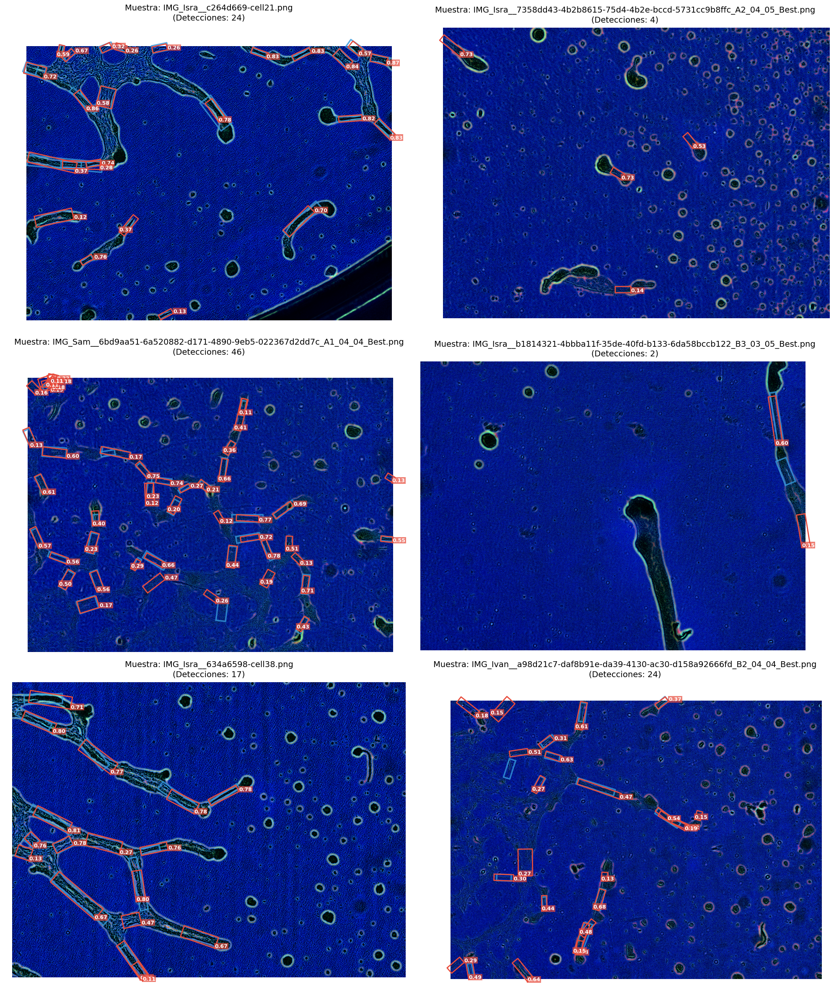

In [11]:
def visualize_qa_samples(model, img_dir, label_dir, num_samples=4):
    """
    Visualiza predicciones detectando automáticamente formatos OBB o HBB.
    Muestra Ground Truth (Azul) y Predicciones (Rojo) con confianza.
    """
    # 1. Preparación de muestras
    img_files = list(Path(img_dir).glob("*.png"))
    if not img_files:
        print(f"❌ No se encontraron imágenes en {img_dir}")
        return

    samples = random.sample(img_files, min(num_samples, len(img_files)))

    # 2. Configuración de la rejilla
    cols = 2
    rows = (len(samples) + cols - 1) // cols
    fig, axs = plt.subplots(rows, cols, figsize=(20, 8 * rows))

    if num_samples > 1:
        axs = axs.flatten()
    else:
        axs = [axs]

    for i, img_path in enumerate(samples):
        # --- Lectura de imagen ---
        img = cv2.imread(str(img_path))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        h, w, _ = img.shape

        # --- Inferencia ---
        # Es vital usar el imgsz de entrenamiento (1024) para mantener la precisión
        results = model.predict(source=img, conf=0.1, verbose=False, imgsz=1024)[0]

        # --- Cargar Ground Truth (Azul) ---
        label_path = Path(label_dir) / (img_path.stem + ".txt")
        gt_polys = read_myotube_labels(label_path, w, h)

        axs[i].imshow(img)

        # Dibujar Polígonos Reales (GT)
        for poly in gt_polys:
            if poly.is_valid:
                x_pts, y_pts = poly.exterior.xy
                axs[i].plot(x_pts, y_pts, color='#3498db', linewidth=2.5, alpha=0.8)

        # --- Dibujar Predicciones (Rojo) ---
        num_detections = 0

        # CASO A: El modelo es OBB (Oriented Bounding Boxes) - Muy común en tus miotubos
        if hasattr(results, 'obb') and results.obb is not None and len(results.obb) > 0:
            num_detections = len(results.obb)
            # xyxyxyxy contiene las 4 esquinas de la caja rotada en píxeles
            obb_coords = results.obb.xyxyxyxy.cpu().numpy()
            confs = results.obb.conf.cpu().numpy()

            for poly_pts, conf in zip(obb_coords, confs):
                # Cerramos el polígono volviendo al primer punto para que el dibujo sea continuo
                poly_to_plot = np.vstack([poly_pts, poly_pts[0]])
                axs[i].plot(poly_to_plot[:, 0], poly_to_plot[:, 1], color='#e74c3c', linewidth=2)

                # Etiqueta de confianza sobre el primer punto del polígono
                axs[i].text(poly_pts[0,0], poly_pts[0,1] - 5, f"{conf:.2f}",
                            color='white', fontsize=9, fontweight='bold',
                            bbox=dict(facecolor='#e74c3c', alpha=0.7, edgecolor='none', pad=1))

        # CASO B: El modelo es HBB (Cajas Horizontales Estándar)
        elif hasattr(results, 'boxes') and results.boxes is not None and len(results.boxes) > 0:
            num_detections = len(results.boxes)
            boxes = results.boxes.xyxy.cpu().numpy()
            confs = results.boxes.conf.cpu().numpy()

            for b, conf in zip(boxes, confs):
                x1, y1, x2, y2 = b
                rect = patches.Rectangle((x1, y1), x2-x1, y2-y1, linewidth=2,
                                       edgecolor='#e74c3c', facecolor='none')
                axs[i].add_patch(rect)

                axs[i].text(x1, y1 - 5, f"{conf:.2f}", color='white', fontsize=9,
                            fontweight='bold', bbox=dict(facecolor='#e74c3c', alpha=0.7, edgecolor='none', pad=1))

        # --- Configuración Visual Final ---
        axs[i].set_title(f"Muestra: {img_path.name}\n(Detecciones: {num_detections})", fontsize=14, pad=10)
        axs[i].axis('off')

    # Ocultar subplots vacíos
    for j in range(i + 1, len(axs)):
        axs[j].axis('off')

    plt.tight_layout()
    plt.show()

# --- EJECUCIÓN DEL TEST VISUAL ---
# Se recomienda un número par (4, 6, 8) para llenar las filas de 2
visualize_qa_samples(model_raw, TEST_IMAGES, TEST_LABELS, num_samples=6)